<a href="https://colab.research.google.com/github/JRiveraB23/SyS05/blob/main/TransformadaZ.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Ejercicios

1. Descargue 10 segundos de la canción de su preferencia desde youtube, y generé un filtro pasabanda (el usuario debe poder definir las frecuencias de corte) para cada uno de los filtros descritos (el usuario también debe poder fijar los parámetros de diseño de cada filtro). Compare los resultados de los filtros estudiados en este cuaderno tipo IIR para diseño Butterworth, Chebyshev 1, Chebyshev 2, Bessel y Elíptico.

3. Incluya la implementación del filtro `firwin` en el punto 1.

In [63]:
import soundfile as sf
import scipy
import numpy as np

from scipy.signal import butter
from scipy.signal import cheby1
from scipy.signal import cheby2
from scipy.signal import bessel
from scipy.signal import ellip
from scipy.signal import firwin
from scipy.signal import lfilter, filtfilt
from scipy.signal import freqz_zpk
from IPython.display import Markdown as md
from IPython.display import Audio
from matplotlib import pyplot as plt
from matplotlib.patches import Circle

In [64]:
!python3 -m pip install --force-reinstall https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz

  Using cached https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz (2.6 MB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached mutagen-1.47.0-py3-none-any.whl (194 kB)
  Using cached pycryptodomex-3.19.0-cp35-abi3-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (2.1 MB)
  Using cached websockets-12.0-cp310-cp310-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl (130 kB)
  Using cached certifi-2023.11.17-py3-none-any.whl (162 kB)
  Using cached requests-2.31.0-py3-none-any.whl (62 kB)
  Using cached urllib3-2.1.0-py3-none-any.whl (104 kB)
  Using cached Brotli-1.1.0-cp310-cp310-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_12_x86_64.manylinux2010_x86_64.whl (3.0 MB)
  Using cached charset_normalizer-3.3.2-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (142 kB)
  Using cached idna-3.4-py3-none-

In [65]:
import os
import yt_dlp as youtube_dl
def download_ytvid_as_mp3(video_url,name):
    #video_url = input("enter url of youtube video:")
    video_info = youtube_dl.YoutubeDL().extract_info(url = video_url,download=False)
    filename = f"{name}.mp3"
    options={
        'format':'bestaudio/best',
        'keepvideo':False,
        'outtmpl':filename,
    }

    with youtube_dl.YoutubeDL(options) as ydl:
        ydl.download([video_info['webpage_url']])

    print("Download complete... {}".format(filename))

In [66]:
link_= ["https://www.youtube.com/watch?v=zSKEwdM-U9s"]
name_ = ['Ancho PR - Bad Bunny & mas artistas'
        ]
for name,link in zip(name_,link_):
    print(name)
    download_ytvid_as_mp3(link,name)

Ancho PR - Bad Bunny & mas artistas
[youtube] Extracting URL: https://www.youtube.com/watch?v=zSKEwdM-U9s
[youtube] zSKEwdM-U9s: Downloading webpage
[youtube] zSKEwdM-U9s: Downloading ios player API JSON
[youtube] zSKEwdM-U9s: Downloading android player API JSON
[youtube] zSKEwdM-U9s: Downloading m3u8 information
[youtube] Extracting URL: https://www.youtube.com/watch?v=zSKEwdM-U9s
[youtube] zSKEwdM-U9s: Downloading webpage
[youtube] zSKEwdM-U9s: Downloading ios player API JSON
[youtube] zSKEwdM-U9s: Downloading android player API JSON
[youtube] zSKEwdM-U9s: Downloading m3u8 information
[info] zSKEwdM-U9s: Downloading 1 format(s): 251
[download] Ancho PR - Bad Bunny & mas artistas.mp3 has already been downloaded
[download] 100% of    6.14MiB
Download complete... Ancho PR - Bad Bunny & mas artistas.mp3


In [67]:
# Instalamos la extensión soundfile
!pip install soundfile

In [68]:
import subprocess
for name in name_:
    subprocess.call(['ffmpeg','-y', '-i', name+'.mp3',
                   name+'.wav'])

In [69]:
import soundfile as sf
for name in name_:
    nombre_out = "output.wav"
    x, fs = sf.read(name+'.wav')

    print('Frecuencia de muestreo %.2f[Hz]\naudio %s' % (fs,name+'.wav'))

print('Frecuencia de muestreo %.2f[Hz]' %(fs))
xpro = x.copy()
inicial =  25
final =  35

corte1= 5000
corte2= 10000

ti = inicial
tf = final
xs = xpro[int(ti*fs):int((tf*fs)),:]
K= int(len(xs)/2) + 1
print(f'Audio original:')
Audio([xs[:,1], xs[:,0]],rate=fs)

Frecuencia de muestreo 48000.00[Hz]
audio Ancho PR - Bad Bunny & mas artistas.wav
Frecuencia de muestreo 48000.00[Hz]
Audio original:


In [70]:
filtrado="bandpass"
N_orden=6

if filtrado=='highpass' or filtrado=='lowpass':
  wn=corte1
elif filtrado=='bandpass' or filtrado=='bandstop':
  wn=[corte1,corte2]

num, den = butter(N_orden, Wn=wn, btype=filtrado, output='ba',fs=fs)

xf = filtfilt(num, den, xs, axis=0)
print('Audio filtrado')
Audio([xf[:,1], xf[:,0]],rate=fs)

Audio filtrado


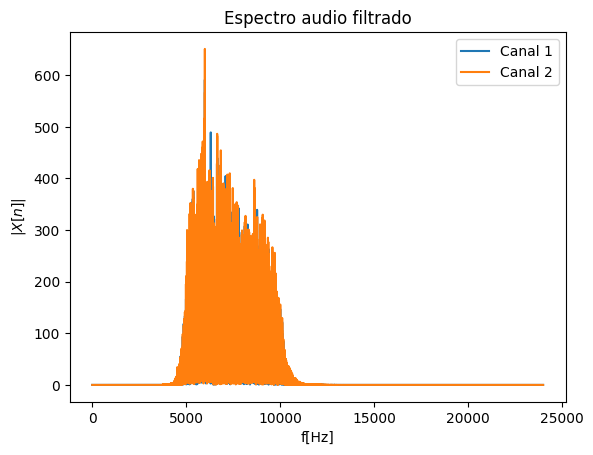

In [71]:
xpro = xf.copy()
Xw = np.fft.rfft(xpro,axis=0) # fft por cada columna de xpro
vf = np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()

In [72]:
filtrado="bandpass"
N_orden=2
ripple=7

if filtrado=='highpass' or filtrado=='lowpass':
  wn=corte1
elif filtrado=='bandpass' or filtrado=='bandstop':
  wn=[corte1,corte2]

num, den=cheby1(N_orden, rp=ripple, Wn=wn, btype=filtrado, output='ba', fs=fs)

xf = filtfilt(num, den, xs, axis=0)
print('Audio filtrado')
Audio([xf[:,1], xf[:,0]],rate=fs)

Audio filtrado


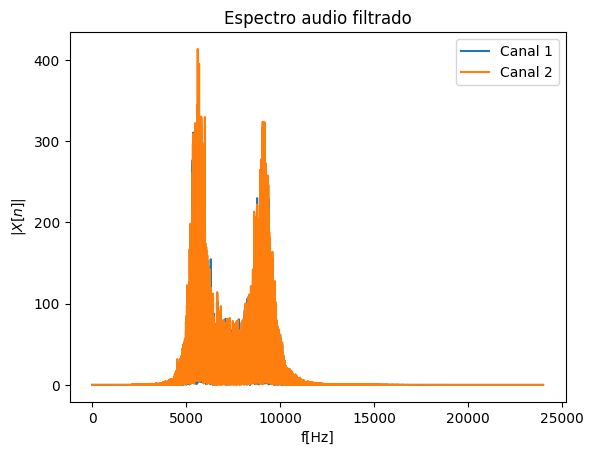

In [73]:
xpro = xf.copy()
Xw = np.fft.rfft(xpro,axis=0)
vf = np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()

In [74]:
filtrado="bandpass"
N_orden=6
ripple=10

if filtrado=='highpass' or filtrado=='lowpass':
  wn=corte1
elif filtrado=='bandpass' or filtrado=='bandstop':
  wn=[corte1,corte2]

num, den = cheby2(N_orden, rs=ripple, Wn=wn, btype=filtrado, output='ba', fs=fs)

xf = filtfilt(num, den, xs, axis=0)
print('Audio filtrado')
Audio([xf[:,1], xf[:,0]],rate=fs)

Audio filtrado


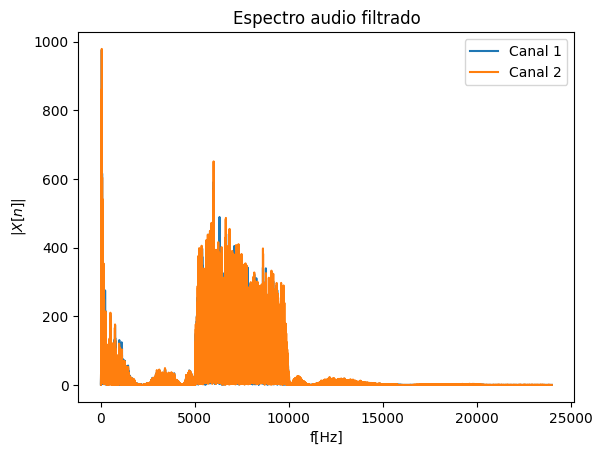

In [75]:
xpro = xf.copy()
Xw = np.fft.rfft(xpro,axis=0)
vf = np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()

In [76]:
filtrado="bandpass"
N_orden=6
normali="mag"

if filtrado=='highpass' or filtrado=='lowpass':
  wn=corte1
if filtrado=='bandpass' or filtrado=='bandstop':
  wn=[corte1,corte2]
num, den = bessel(N_orden, wn, btype=filtrado, output='ba', norm = normali, fs=fs)

xf = filtfilt(num, den, xs, axis=0)
print('Audio filtrado:')
Audio([xf[:,1], xf[:,0]],rate=fs)

Audio filtrado:


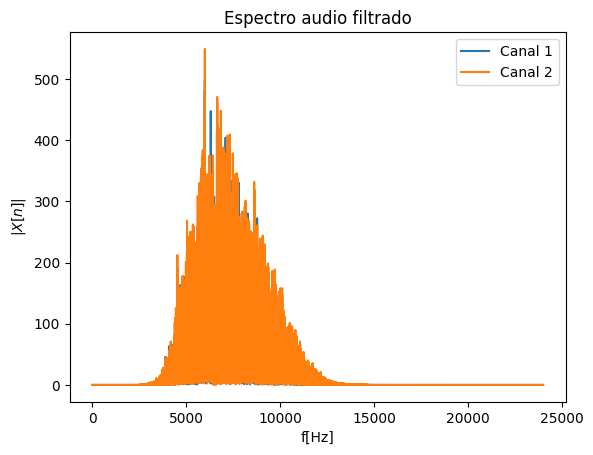

In [77]:
xpro = xf.copy()
Xw = np.fft.rfft(xpro,axis=0)
vf = np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()

In [78]:
filtrado="bandpass"
N_orden=6
ripple_pass=3
ripple_stop=6

wn=[3000,6000]
if filtrado=='highpass' or filtrado=='lowpass':
  wn=corte1
if filtrado=='bandpass' or filtrado=='bandstop':
  wn=[corte1,corte2]
num, den=ellip(N_orden, rp=ripple_pass, rs=ripple_stop, Wn=wn, btype=filtrado, fs=fs)

xf=filtfilt(num, den, xs, axis=0)
print('Audio filtrado')
Audio([xf[:,1], xf[:,0]],rate=fs)

Audio filtrado


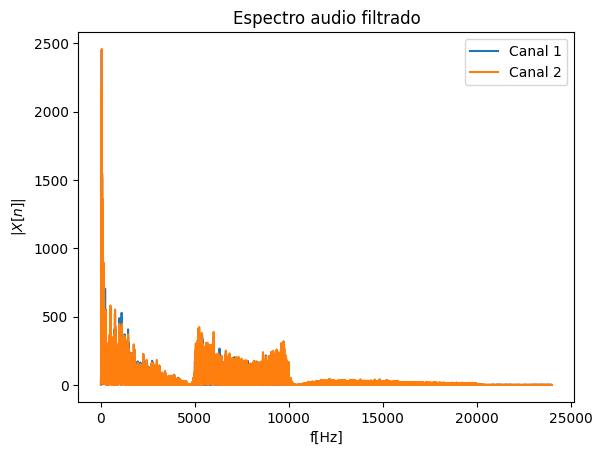

In [79]:
xpro = xf.copy()
Xw = np.fft.rfft(xpro,axis=0)
vf = np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()

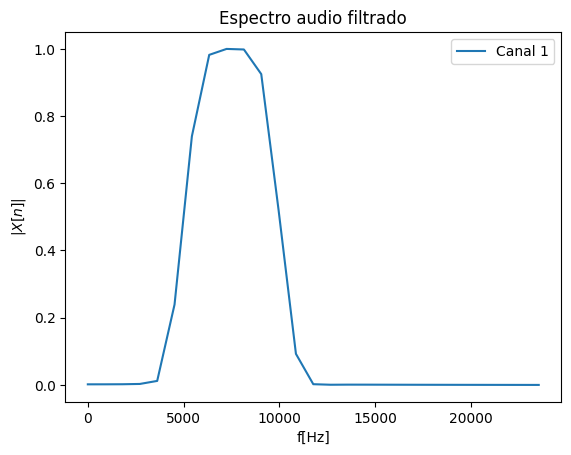

In [80]:
N_orden=53

coeff_fir=firwin(N_orden, [corte1, corte2], pass_zero=False, fs=fs)

xpro=coeff_fir.copy()
Xw=np.fft.rfft(coeff_fir,axis=0)
vf=np.fft.rfftfreq(np.size(xpro,0),1/fs)
plt.plot(vf,abs(Xw))
plt.legend(('Canal 1','Canal 2'))
plt.title(r'Espectro audio filtrado')
plt.xlabel(r'f[Hz]')
plt.ylabel(r'$|X[n]|$')
plt.show()



2. Consulte en qué consiste el método de diseño de filtros FIR por ventaneo (Ver función [firwin](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.firwin.html) y [material de apoyo](https://www.programcreek.com/python/example/100540/scipy.signal.firwin)). Realice un cuadro comparativo de las ventajas y desventajas de los filtros IIR y los FIR. Nota: Recuerde que un filtro FIR utiliza solamente raíces tipo ceros, es decir que $a_0=1$, y $a_k=0$ $\forall k\in\{1,2,\dots\}$.

El método de diseño de filtros FIR (Finite Impulse Response) por ventaneo es una técnica utilizada para diseñar filtros digitales FIR mediante la multiplicación de una ventana con una respuesta de frecuencia ideal. El propósito de aplicar la ventana es limitar la duración finita de la respuesta al impulso del filtro FIR, que es infinita en teoría, para hacerla práctica y realizable en sistemas digitales. La función `firwin` en SciPy es una herramienta comúnmente utilizada para implementar este método en Python.

### Ventajas de los Filtros FIR:
1. **Estabilidad:** Los filtros FIR son siempre estables ya que no tienen polos en el plano Z.
2. **Implementación sencilla:** La estructura FIR es más simple de implementar, ya que no requiere realimentación.
3. **Respuesta al impulso controlada:** La respuesta al impulso de un filtro FIR puede ser controlada directamente por el diseñador mediante la elección de la longitud del filtro y la forma de la ventana.

### Desventajas de los Filtros FIR:
1. **Mayor orden:** En general, los filtros FIR tienden a requerir un mayor orden para alcanzar las mismas especificaciones de diseño que un filtro IIR.
2. **Mayor latencia:** Debido a su naturaleza no recursiva, los filtros FIR pueden introducir más latencia en el sistema.
3. **Menor eficiencia computacional:** En términos de implementación, los filtros FIR suelen ser más intensivos computacionalmente que los IIR, especialmente a altos órdenes.

### Ventajas de los Filtros IIR:
1. **Orden más bajo:** En general, los filtros IIR pueden cumplir con las mismas especificaciones con un orden menor en comparación con los FIR.
2. **Menor latencia:** Debido a su realimentación, los filtros IIR pueden tener menor latencia que los FIR del mismo orden.
3. **Eficiencia computacional:** Los filtros IIR son más eficientes en términos de implementación, especialmente a bajos órdenes.

### Desventajas de los Filtros IIR:
1. **Posible inestabilidad:** Algunos diseños de filtros IIR pueden ser inestables si no se eligen cuidadosamente.
2. **Menos control sobre la respuesta al impulso:** La respuesta al impulso en los filtros IIR no se puede controlar directamente de la misma manera que en los FIR.